In [1]:
import pandas as pd
import datetime as dt
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sb

In [2]:
pd.set_option('display.max_columns', None)

In [3]:
# position_history = pd.read_csv('../data/raw/TRUMPF_Indoor_Logistik_Dataset/position_history_new_starts_at_01.07.2018.tsv', delimiter='\t')
# items = pd.read_csv('../data/raw/TRUMPF_Indoor_Logistik_Dataset/items.tsv', delimiter='\t', engine='python')
# items_history = pd.read_csv('../data/raw/TRUMPF_Indoor_Logistik_Dataset/itemshistory.tsv', delimiter='\t', engine='python')
# areas = pd.read_csv('../data/raw/TRUMPF_Indoor_Logistik_Dataset/areas.tsv', delimiter='\t', engine='python')

# Load Data

In [4]:
df = pd.read_csv('df10s.csv')

In [5]:
df.set_index('address', inplace=True)

In [6]:
df.timestamp = pd.to_datetime(df.timestamp)

In [7]:
neuer_Auftrag = np.array([[7.297733907668686,-4.805841773673882],[7.297733907668686,-3.052331795888114],[11.52842464772324,-2.8296638622010324],
                          [11.361423697457928,-4.666674315119456],[7.297733907668686,-4.805841773673882]])

# Plots

In [8]:
def plot_path(df, address=359037136983245745):
    temp = df.loc[address]
    plt.plot(temp.x, temp.y)
    plt.plot(neuer_Auftrag[:, 0], -1*neuer_Auftrag[:, 1])
    plt.show()

In [9]:
# def scatter_path(df, address=359037136983245745):
#     temp = df.loc[address]
#     plt.scatter(temp.x, temp.y)
#     plt.plot(neuer_Auftrag[:, 0], -1*neuer_Auftrag[:, 1], color='red')
#     plt.show()

In [10]:
def scatter_path(df, address=359037136983245745, start='2018-07-01 02:01:10', ende='2018-12-01 02:01:10'):
    temp = df.loc[address]
    temp = temp.reset_index(drop=True).set_index('timestamp').loc[start:ende]
    plt.scatter(temp.x, temp.y)
    plt.plot(neuer_Auftrag[:, 0], -1*neuer_Auftrag[:, 1], color='red')
    plt.show()

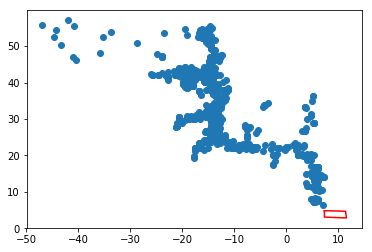

In [79]:
scatter_path(df, address=359037136983245745, start='2018-08-01 00:00:00', ende='2018-08-01 23:59:59')

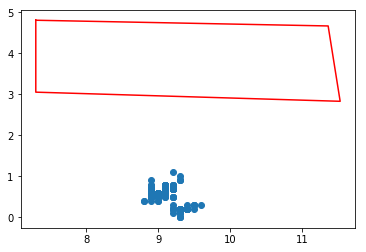

In [87]:
scatter_path(df, address=359037136983245745, start='2018-07-15 00:00:00', ende='2018-07-15 23:59:59')

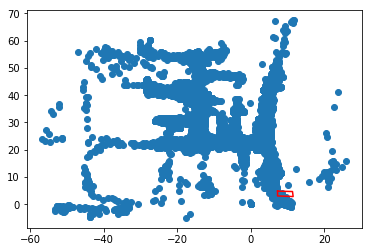

In [19]:
scatter_path(df)

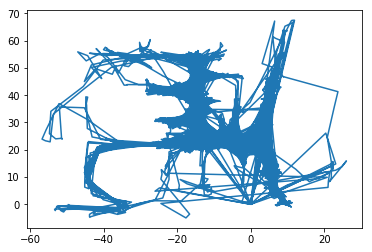

In [47]:
plot_path(df10s)

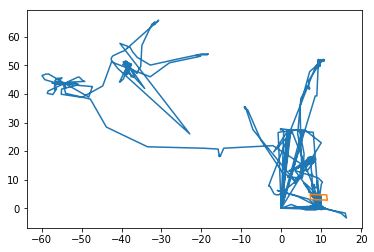

In [20]:
plot_path(df, 145401774635637016)

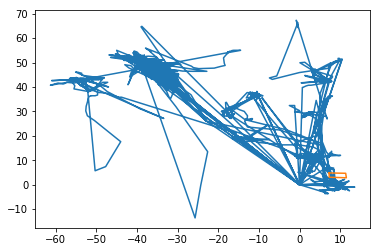

In [21]:
plot_path(df, 4751451578702838656)

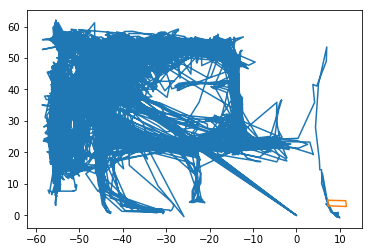

In [143]:
plot_path(df, 1864515622891090337)

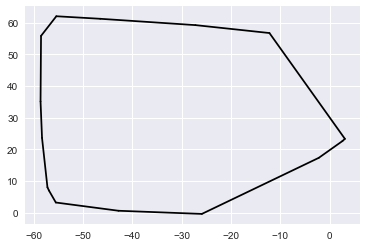

In [181]:
find_important_areas(df, 1864515622891090337)

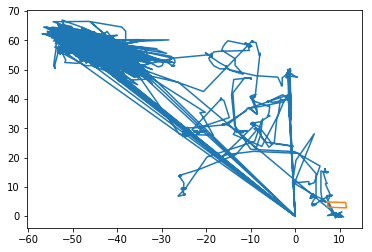

In [144]:
plot_path(df, 4646720082062120060)

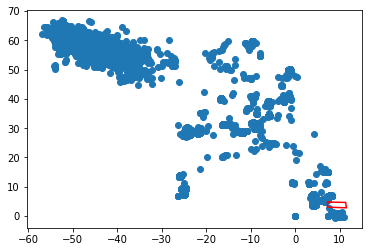

In [145]:
scatter_path(df, 4646720082062120060)

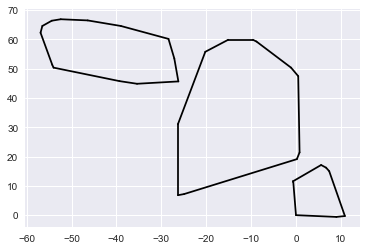

In [182]:
find_important_areas(df, 4646720082062120060)

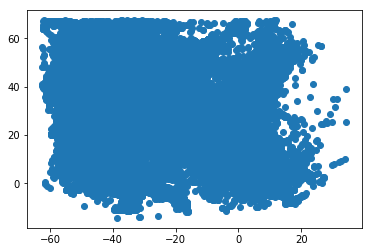

In [53]:
plt.scatter(df.x, df.y)

# Important Areas

In [11]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.preprocessing import StandardScaler

In [12]:
from scipy.spatial import ConvexHull

In [13]:
plt.rcParams["figure.figsize"] = (20,20)

In [14]:
from scipy.misc import imread

C:\Users\Daniel\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  if __name__ == '__main__':


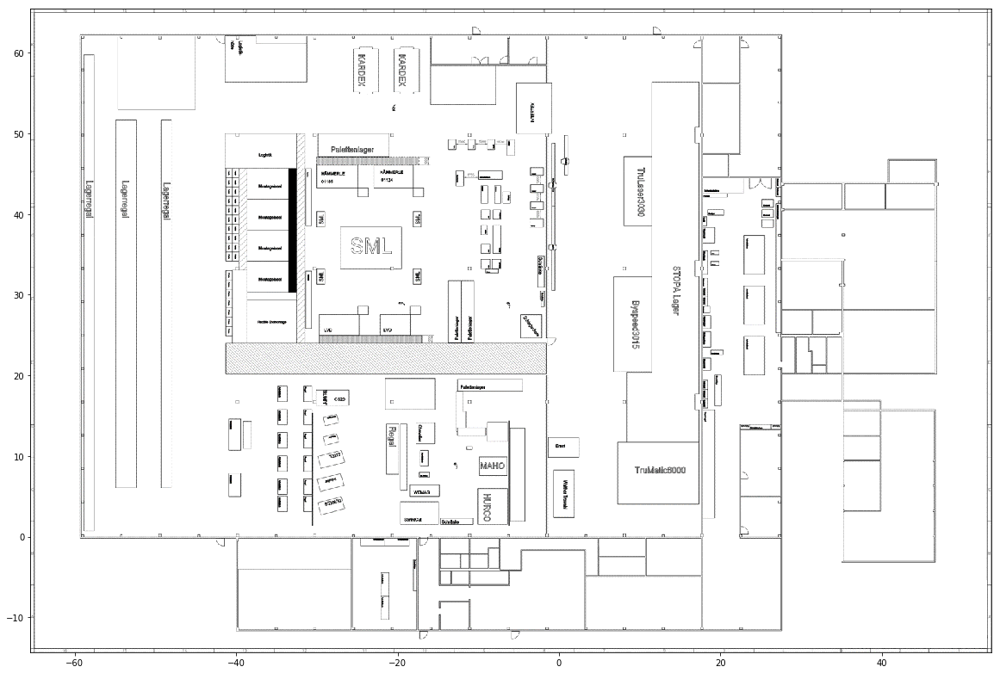

In [18]:
img = imread("ShopFloorLayout.png")
plt.imshow(img,zorder=0,extent=[-65.5, 53.6, -14.325, 65.5])

In [15]:
def find_important_areas(df, addresse, min_area=20):
    temp = df.loc[addresse, ['x', 'y']]
    scaled = StandardScaler().fit_transform(temp)
    db = DBSCAN(eps=0.3, min_samples=10).fit(scaled)
    temp['cluster'] = db.labels_
    
    for c in temp.cluster.unique():
        if c != -1:
            points = np.array(temp.loc[temp.cluster == c, ['x', 'y']])

            hull = ConvexHull(points)
            if hull.area >=20:
                for simplex in hull.simplices:
                    plt.plot(points[simplex, 0], points[simplex, 1], 'k-')    

In [47]:
def scatter_path(df, address=145401774635637016, start=None, ende=None, lines=False, min_area=None):
    plt.imshow(img,zorder=0,extent=[-65.5, 53.6, -14.325, 65.5])
    temp = df.loc[address]
    temp = temp.reset_index(drop=True).set_index('timestamp').loc[start:ende]
    
    if lines == True:
        plt.plot(temp.x, temp.y)
    else:
        plt.scatter(temp.x, temp.y)            
    
    if min_area:
        scaled = StandardScaler().fit_transform(temp)
        db = DBSCAN(eps=0.3, min_samples=10).fit(scaled)
        temp['cluster'] = db.labels_
        
        #plt.scatter(temp[temp.cluster != -1].x, temp[temp.cluster != -1].y, c=db.labels_[temp.cluster != -1])

        for c in temp.cluster.unique():
            if c != -1:
                points = np.array(temp.loc[temp.cluster == c, ['x', 'y']])

                hull = ConvexHull(points)
                if hull.area >=min_area:
                    for simplex in hull.simplices:
                        #plt.plot(points[:,0], points[:,1], 'o')
                        plt.plot(points[simplex, 0], points[simplex, 1], 'k-')
                    
    
    #plt.plot(neuer_Auftrag[:, 0], -1*neuer_Auftrag[:, 1], color='red')
    plt.axis('off')
    #plt.savefig(str(address) + '_'+ start + '_' + ende + '_area.png' , bbox_inches='tight')
    plt.show()

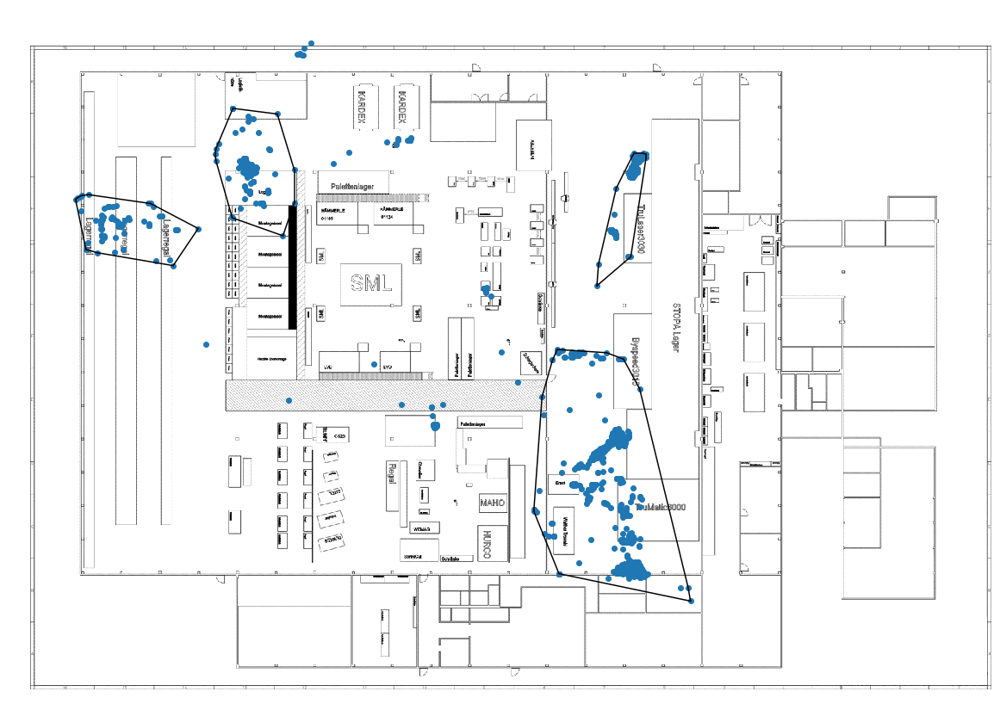

In [21]:
scatter_path(df, address=145401774635637016, start='2018-07-01 02:01:10', ende='2018-12-01 02:01:10', min_area=20)

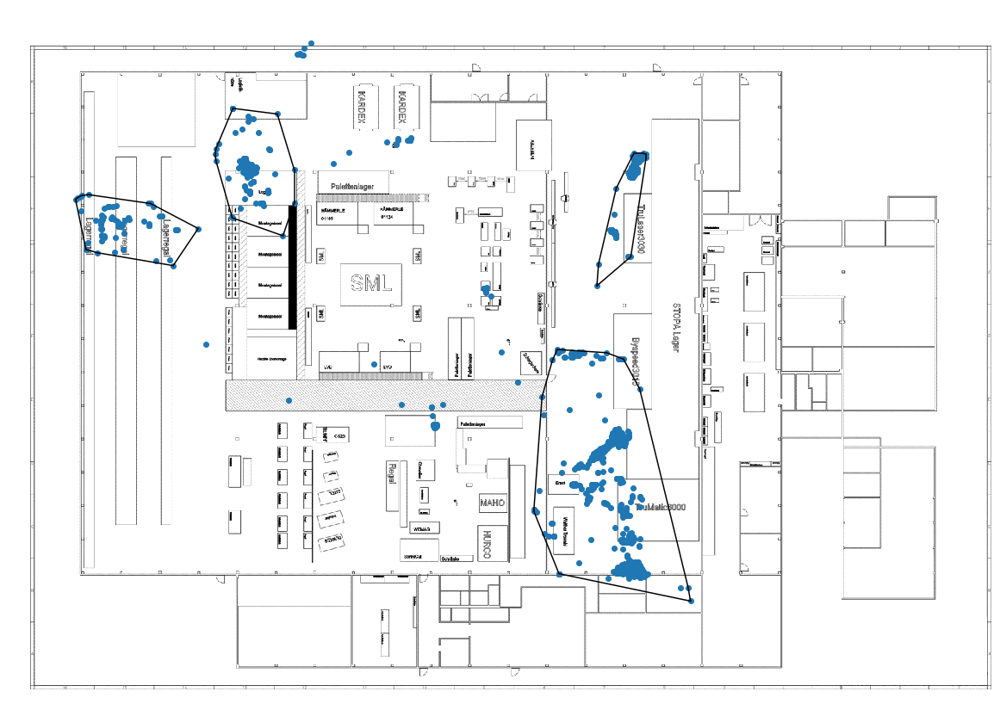

In [22]:
scatter_path(df, address=145401774635637016, min_area=20)

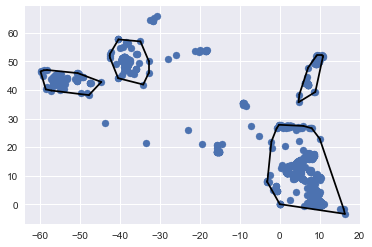

In [216]:
scatter_path(df, address=145401774635637016, start='2018-07-01 02:01:10', ende='2018-12-01 02:01:10', min_area=20)

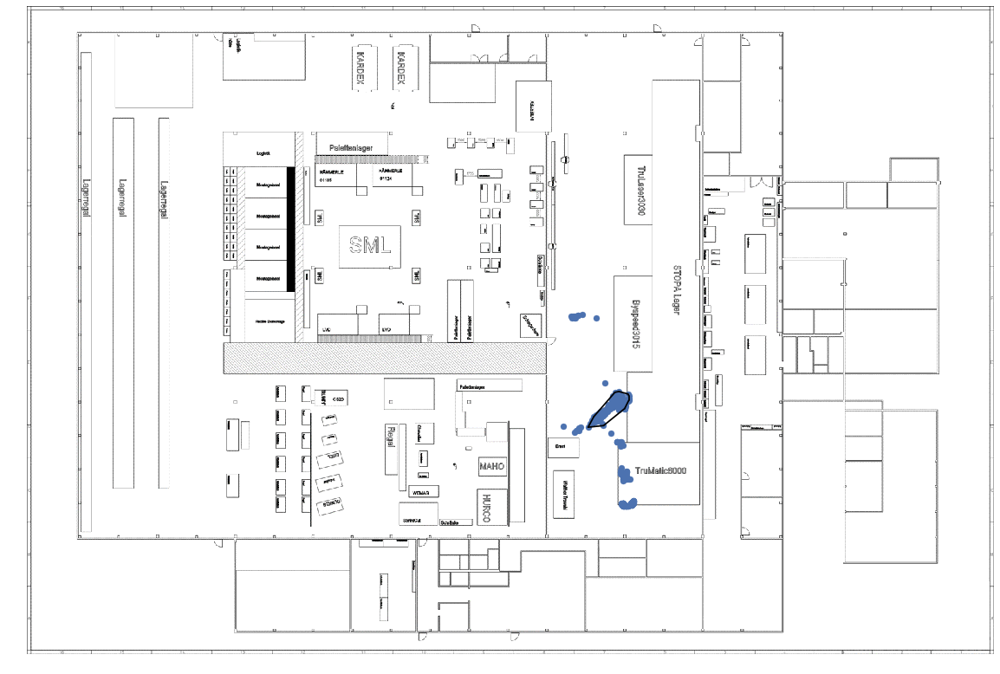

In [266]:
scatter_path(df, address=145401774635637016, start='2018-08-29', ende='2018-08-30', min_area=5)

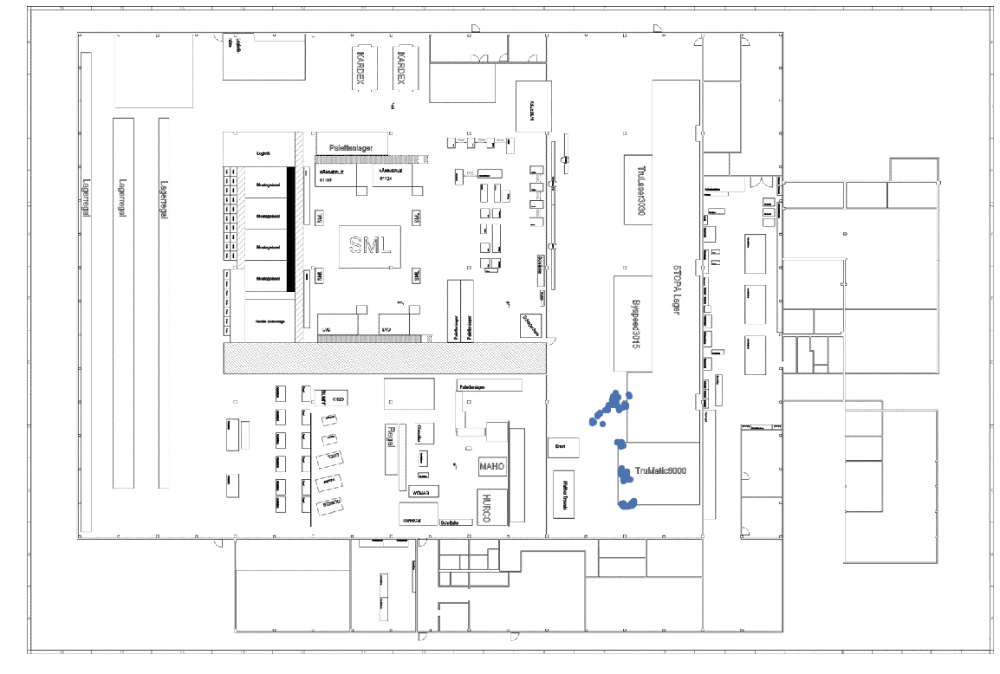

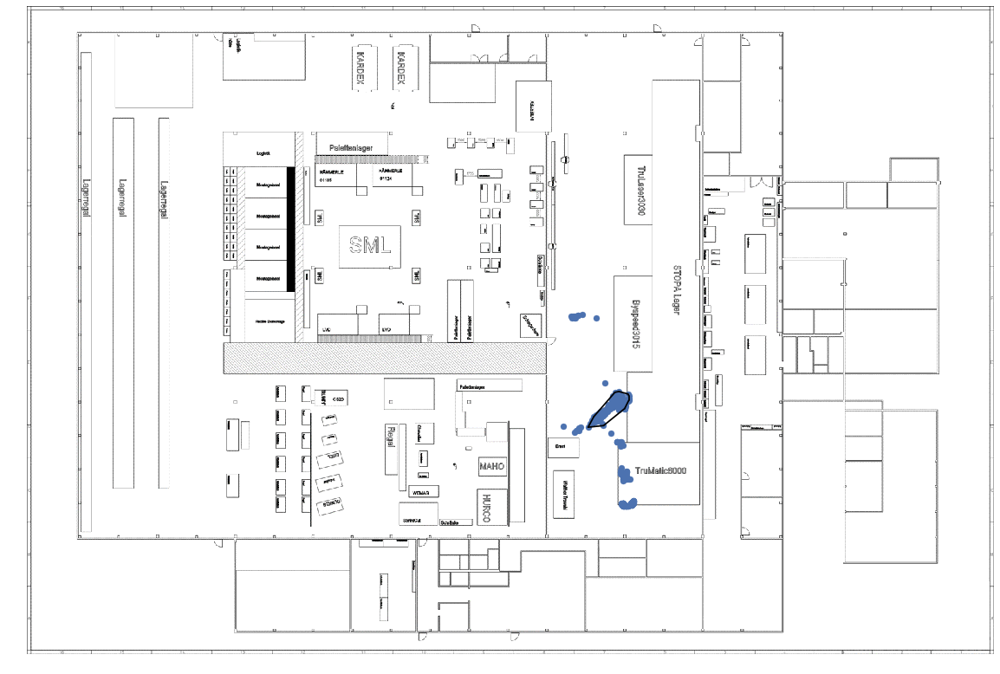

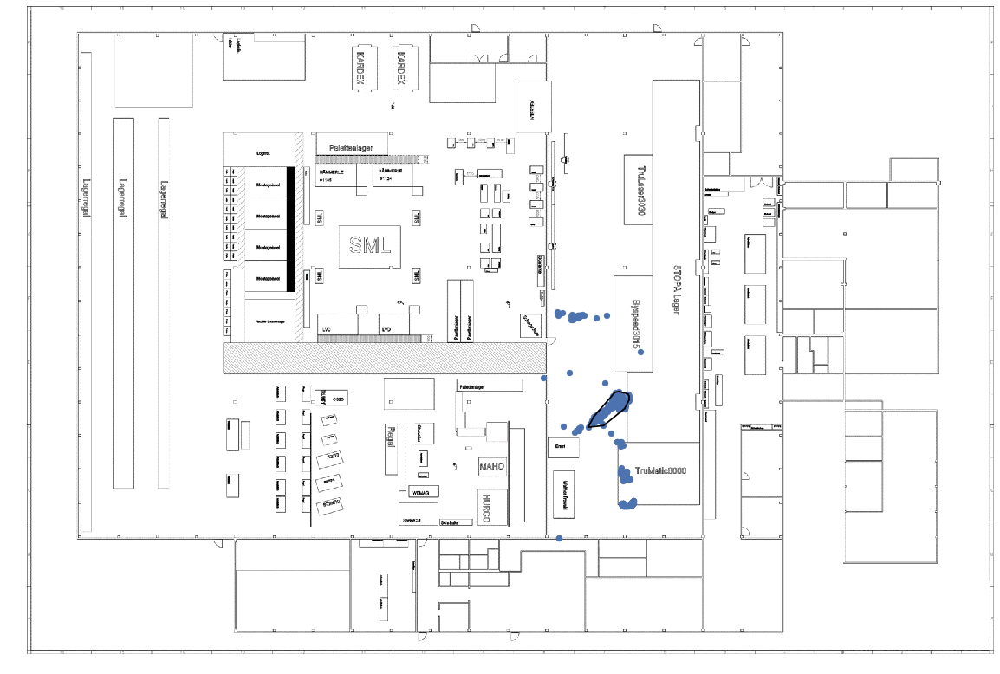

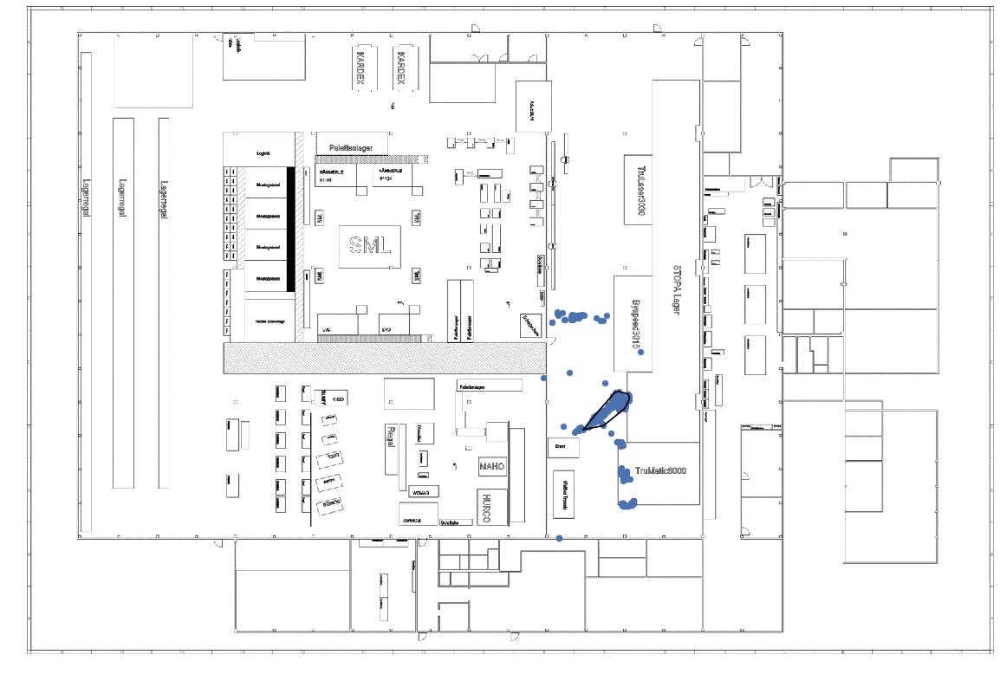

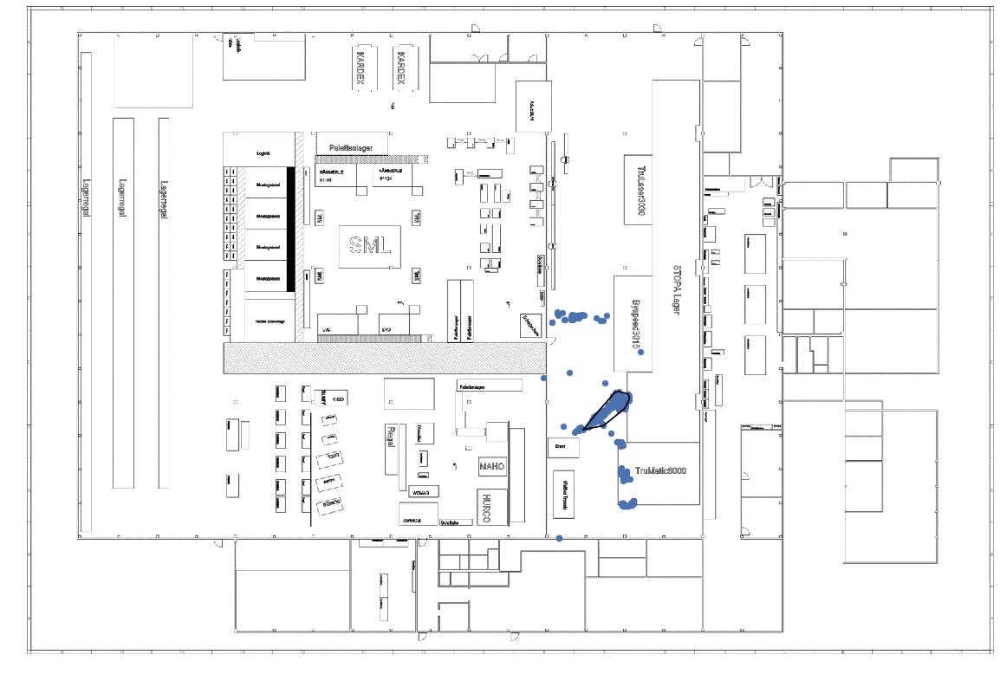

...

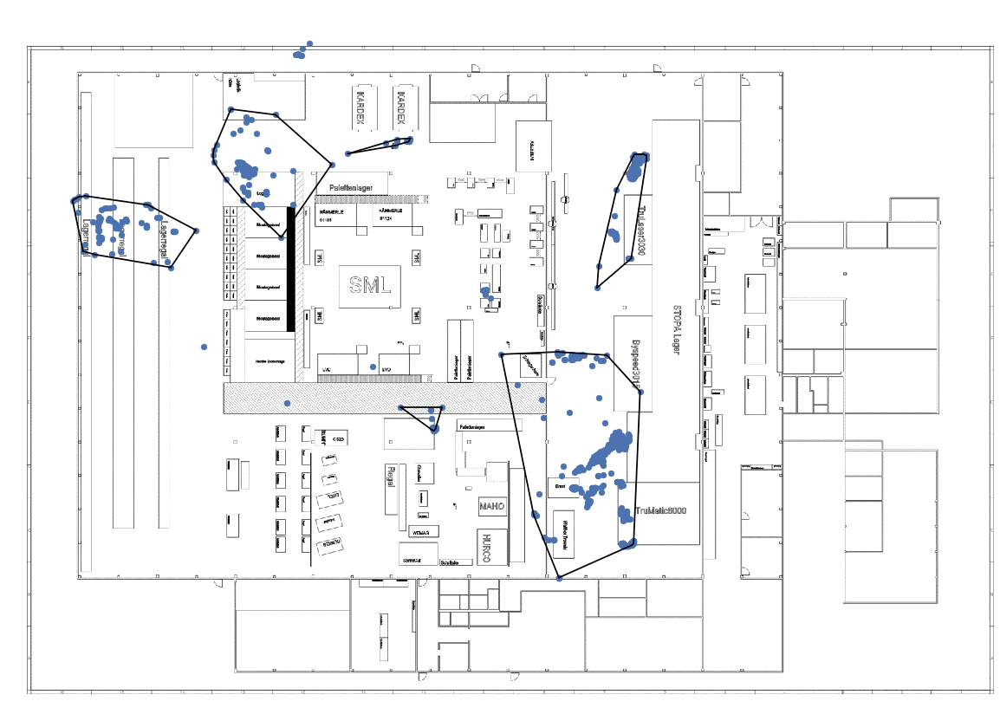

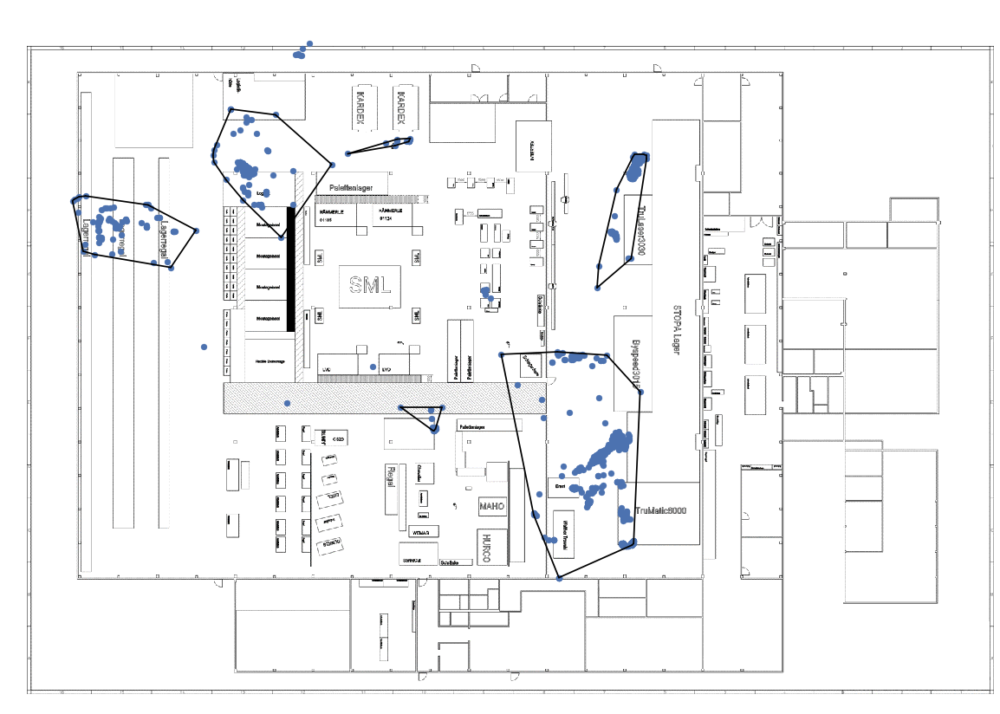

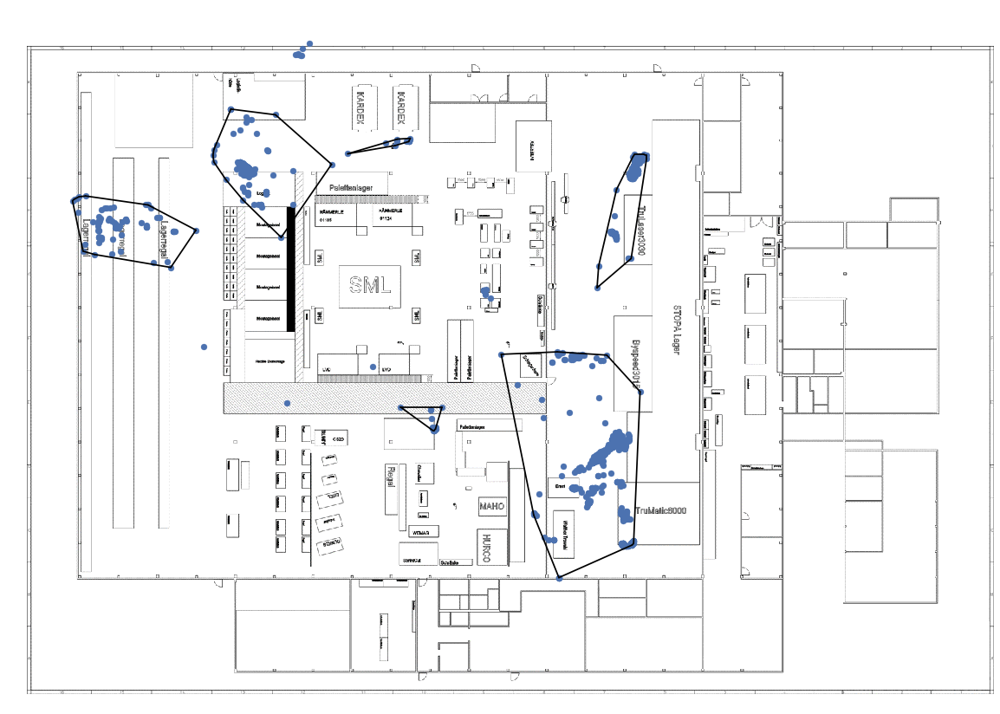

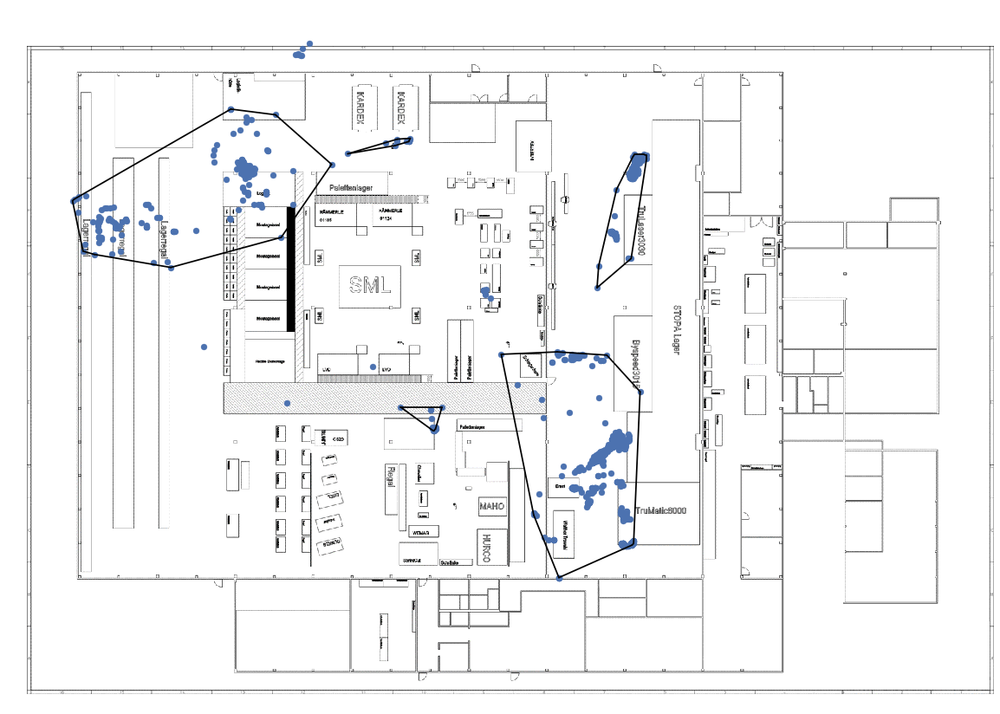

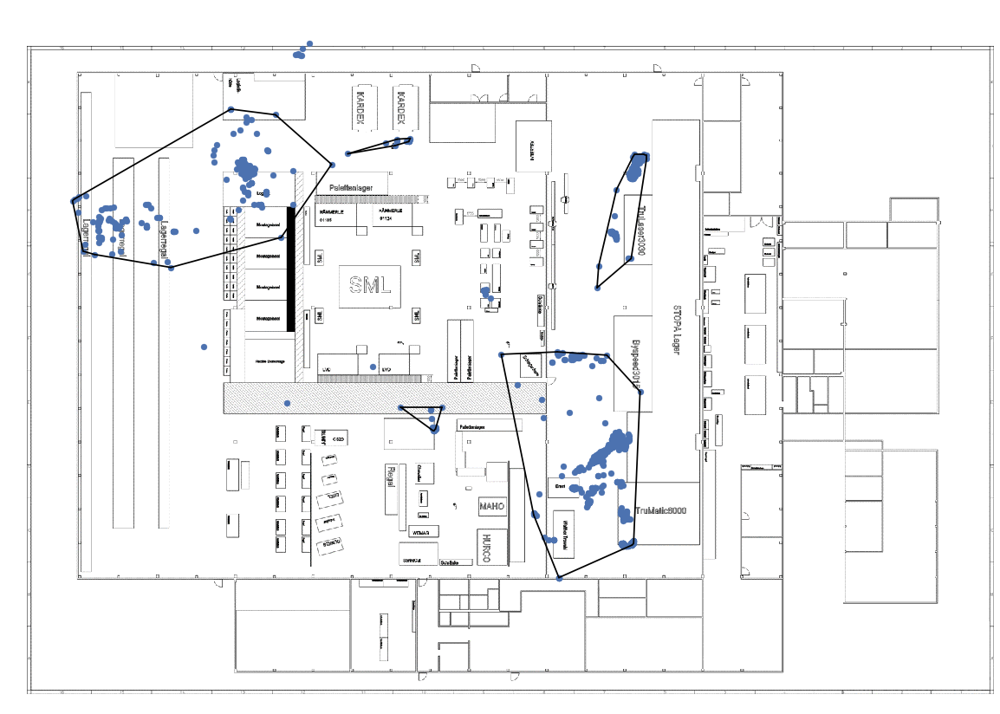

In [269]:
for d in pd.date_range(pd.to_datetime('2018-08-29'), pd.to_datetime('2018-10-19')):
    scatter_path(df, address=145401774635637016, start='2018-08-29', ende=str(d)[0:10], min_area=5)

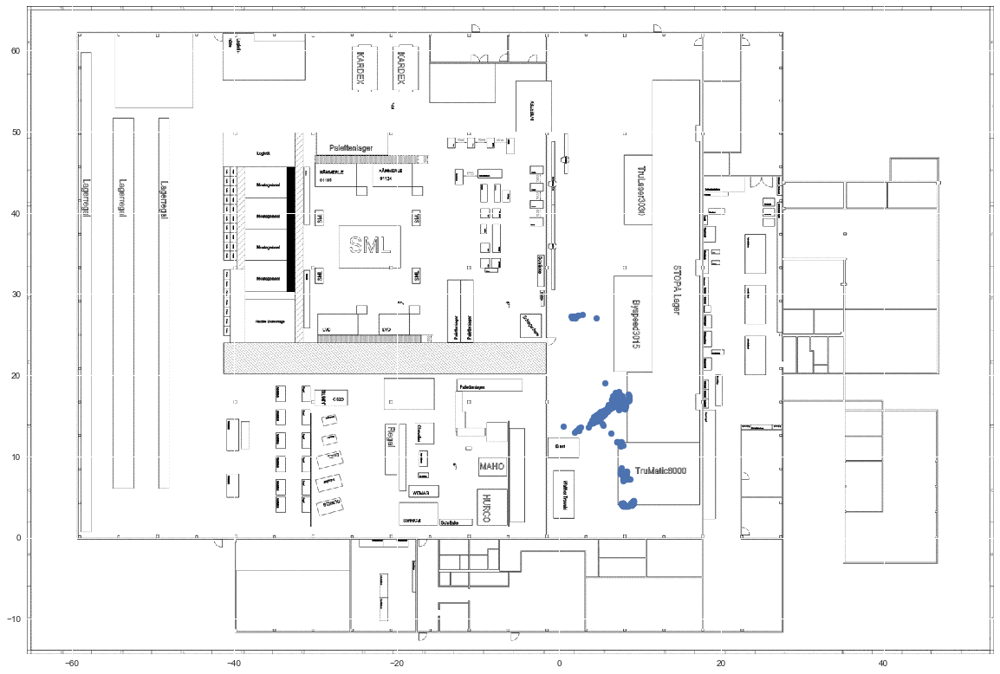

In [247]:
scatter_path(df, address=145401774635637016, start='2018-08-29', ende='2018-08-30', min_area=None)

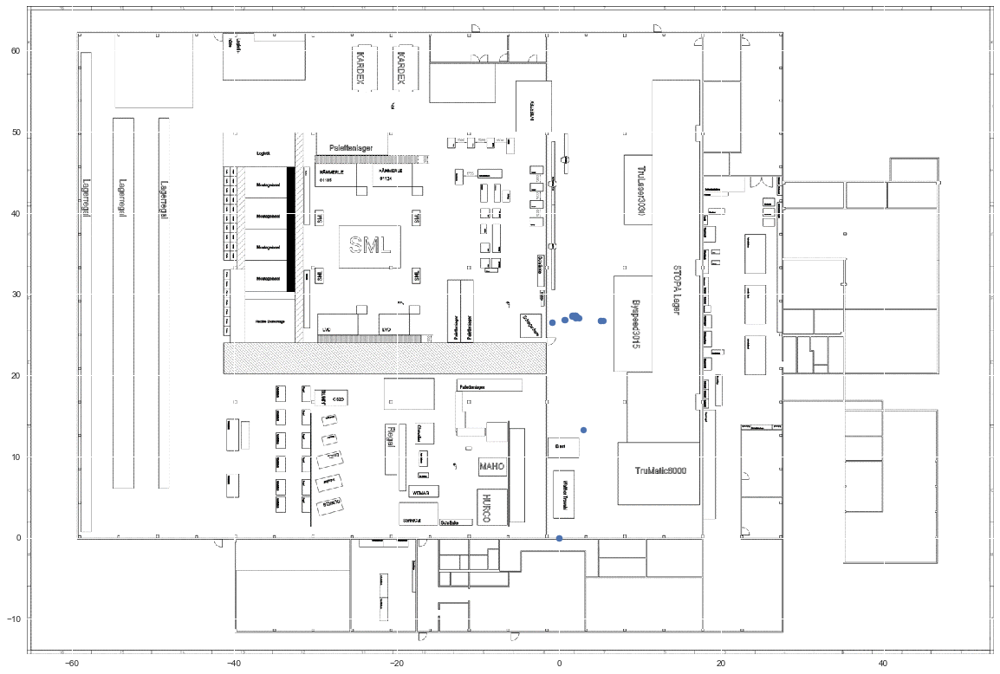

In [242]:
scatter_path(df, address=145401774635637016, start='2018-09-01', ende='2018-09-02', min_area=5)

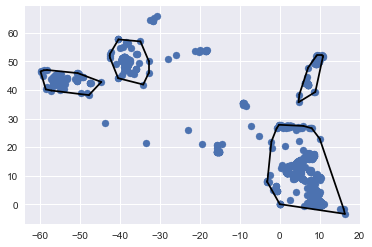

In [229]:
scatter_path(df, address=145401774635637016, start=None, ende=None, min_area=20)

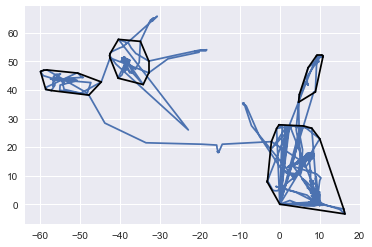

In [217]:
scatter_path(df, address=145401774635637016, start='2018-07-01 02:01:10', ende='2018-12-01 02:01:10', lines=True, min_area=20)

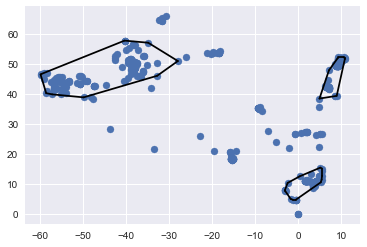

In [219]:
scatter_path(df, address=145401774635637016, start='2018-09-01 02:01:10', ende='2018-12-01 02:01:10', lines=False, min_area=20)

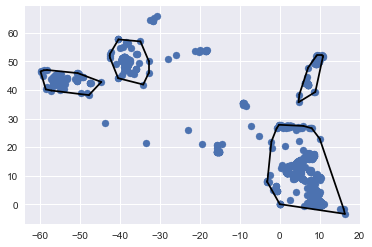

In [220]:
scatter_path(df, address=145401774635637016, start='2018-07-01 02:01:10', ende='2018-12-01 02:01:10', lines=False, min_area=20)

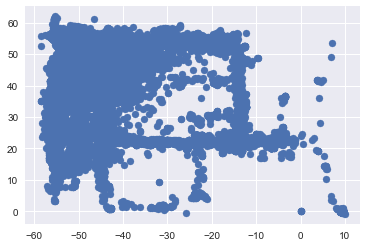

In [227]:
scatter_path(df, address=1864515622891090337, start='2018-07-01 02:01:10', ende='2018-12-01 02:01:10', lines=False, min_area=None)

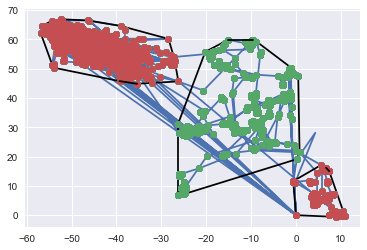

In [209]:
scatter_path(df, address=4646720082062120060, start='2018-07-01 02:01:10', ende='2018-12-01 02:01:10', min_area=20)

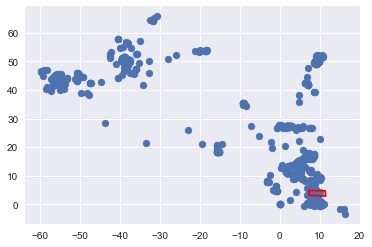

In [191]:
scatter_path(df, address=145401774635637016, start='2018-07-01 02:01:10', ende='2018-12-01 02:01:10')

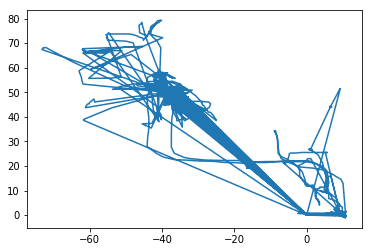

In [71]:
plot_path(position_history, 914845595629141593)

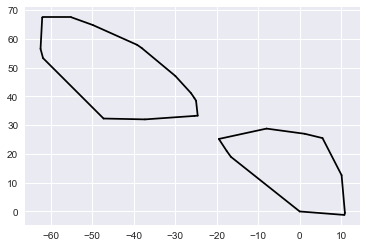

In [180]:
find_important_areas(df, 914845595629141593)

In [91]:
def plot_cluster(df, address=359037136983245745):
    temp = df.loc[address, ['x', 'y']]
    scaled = StandardScaler().fit_transform(temp)
    db = DBSCAN(eps=0.3, min_samples=10).fit(scaled)
    #temp['cluster'] = db.labels_
    plt.scatter(temp.x, temp.y, c=db.labels_)

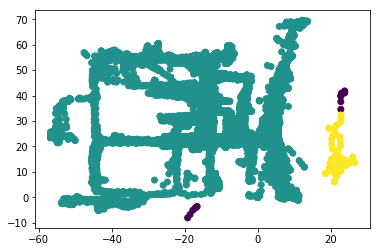

In [166]:
plot_cluster(position_history)

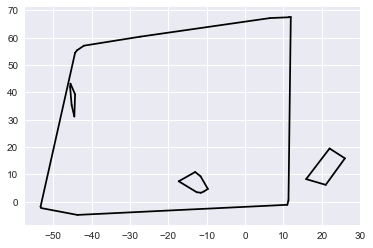

In [179]:
find_important_areas(df, 359037136983245745)

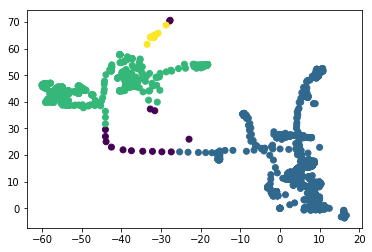

In [167]:
plot_cluster(position_history, address=145401774635637016)

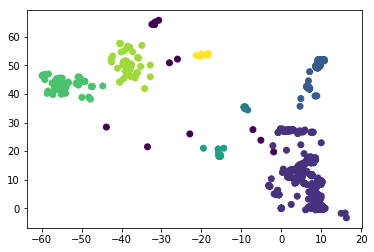

In [94]:
plot_cluster(df, address=145401774635637016)

In [152]:
temp = df.loc[145401774635637016, ['x', 'y']]
scaled = StandardScaler().fit_transform(temp)
db = DBSCAN(eps=0.3, min_samples=10).fit(scaled)

In [153]:
temp['cluster'] = db.labels_

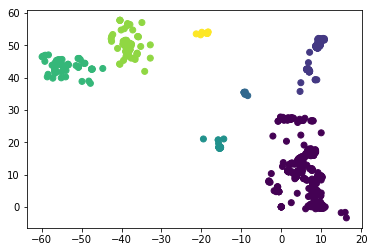

In [131]:
plt.scatter(temp[temp.cluster != -1].x, temp[temp.cluster != -1].y, c=db.labels_[temp.cluster != -1])

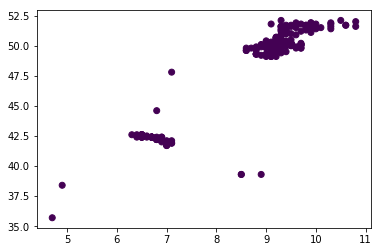

In [130]:
plt.scatter(temp[temp.cluster == 1].x, temp[temp.cluster == 1].y, c=db.labels_[temp.cluster == 1])

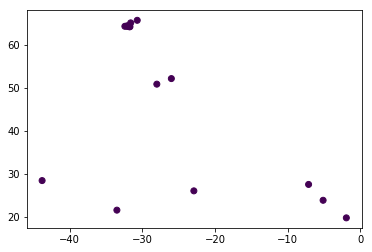

In [132]:
plt.scatter(temp[temp.cluster == -1].x, temp[temp.cluster == -1].y, c=db.labels_[temp.cluster == -1])

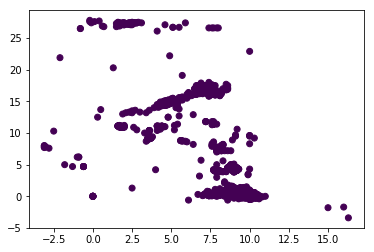

In [133]:
plt.scatter(temp[temp.cluster == 0].x, temp[temp.cluster == 0].y, c=db.labels_[temp.cluster == 0])

In [96]:
temp.head()

,x,y
address,,
145401774635637016,9.2,0.6
145401774635637016,9.2,0.6
145401774635637016,9.2,0.6
145401774635637016,9.2,0.6
145401774635637016,9.2,0.6


In [ ]:
temp = temp[tempcluster !=1]

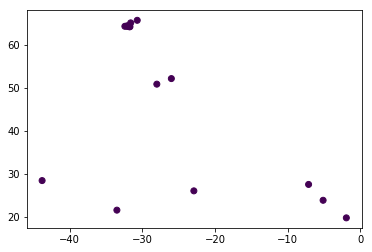

In [156]:
plt.scatter(temp[temp.cluster == -1].x, temp[temp.cluster == -1].y, c=db.labels_[temp.cluster == -1])

In [159]:
sb.set()

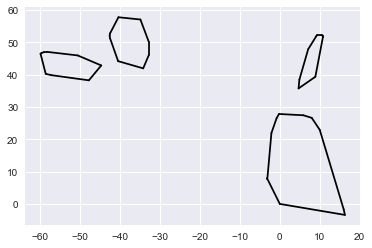

In [178]:
find_important_areas(df, 145401774635637016)

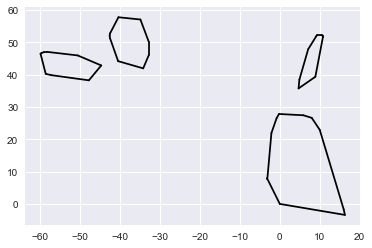

In [175]:
#plt.scatter(temp[temp.cluster != -1].x, temp[temp.cluster != -1].y, c=db.labels_[temp.cluster != -1])

for c in temp.cluster.unique():
    if c != -1:
        points = np.array(temp.loc[temp.cluster == c, ['x', 'y']])

        hull = ConvexHull(points)
        if hull.area >=20:
            for simplex in hull.simplices:
                plt.plot(points[simplex, 0], points[simplex, 1], 'k-')

In [166]:
hulls = []
for c in temp.cluster.unique():
    if c != -1:
        points = np.array(temp.loc[temp.cluster == c, ['x', 'y']])

        hull = ConvexHull(points)
        hulls.append(hull)

In [173]:
hulls[5].area

42.12600771091746

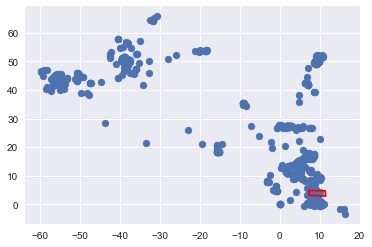

In [165]:
scatter_path(df, address=145401774635637016)

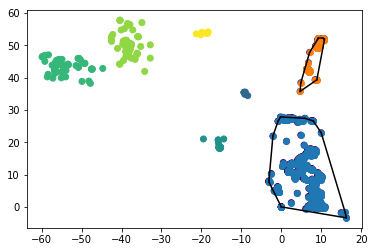

In [141]:
plt.scatter(temp[temp.cluster != -1].x, temp[temp.cluster != -1].y, c=db.labels_[temp.cluster != -1])
c0 = np.array(temp.loc[temp.cluster ==0, ['x', 'y']])

hull = ConvexHull(c0)

plt.plot(c0[:,0], c0[:,1], 'o')
for simplex in hull.simplices:
    plt.plot(c0[simplex, 0], c0[simplex, 1], 'k-')

c1 = np.array(temp.loc[temp.cluster ==1, ['x', 'y']])

hull = ConvexHull(c1)

plt.plot(c1[:,0], c1[:,1], 'o')
for simplex in hull.simplices:
    plt.plot(c1[simplex, 0], c1[simplex, 1], 'k-')

# Examples

In [81]:
def scatter_path(df, address=145401774635637016, start=None, ende=None, lines=False, min_area=None):
    plt.imshow(img,zorder=0,extent=[-65.5, 53.6, -14.325, 65.5])
    temp = df.loc[address]
    temp = temp.reset_index(drop=True).set_index('timestamp').loc[start:ende]
    
    if lines == True:
        plt.plot(temp.x, temp.y)
    else:
        plt.scatter(temp.x, temp.y)            
    
    if min_area:
        scaled = StandardScaler().fit_transform(temp)
        db = DBSCAN(eps=0.3, min_samples=10).fit(scaled)
        temp['cluster'] = db.labels_
        
        #plt.scatter(temp[temp.cluster != -1].x, temp[temp.cluster != -1].y, c=db.labels_[temp.cluster != -1])

        for c in temp.cluster.unique():
            if c != -1:
                points = np.array(temp.loc[temp.cluster == c, ['x', 'y']])

                hull = ConvexHull(points)
                if hull.area >=min_area:                    
                    sb.kdeplot(points[0], points[1], shade=True)
#                     for simplex in hull.simplices:
#                         #plt.plot(points[:,0], points[:,1], 'o')
#                         plt.fill(points[hull.vertices,0], points[hull.vertices,1], alpha=0.05)
#                         #plt.plot(points[simplex, 0], points[simplex, 1], 'k-', lw=2, color='red')
                    
    
    #plt.plot(neuer_Auftrag[:, 0], -1*neuer_Auftrag[:, 1], color='red')
    plt.axis('off')
    #plt.savefig(str(address) + '_'+ start + '_' + ende + '_area.png' , bbox_inches='tight')
    plt.show()

C:\Users\Daniel\Anaconda3\lib\site-packages\seaborn\distributions.py:645: UserWarning: Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.
  warnings.warn(warn_msg, UserWarning)


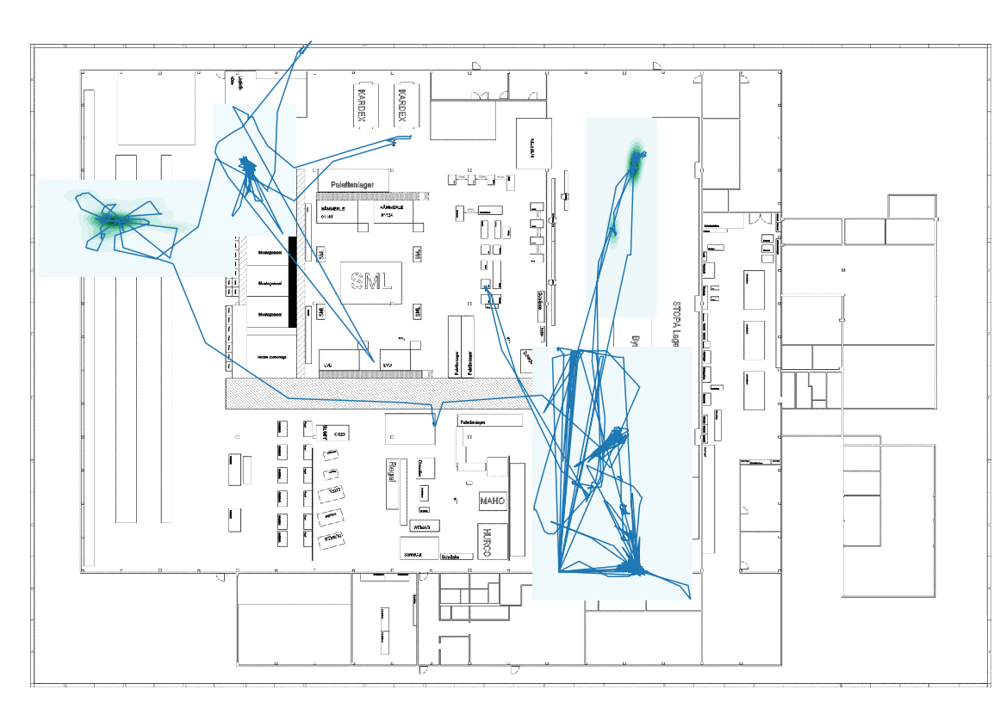

In [82]:
scatter_path(df, address=145401774635637016, min_area=20, lines=True)

In [40]:
df.index.value_counts()

6196490120761152012    43149
7573228149069718550    33465
6958684199778844888    32199
359037136983245745     29534
8405123468908889237    27895
1864515622891090337    26139
7483239427806795846    25466
8762245971590074211    25272
5106149975160207938    24283
4751451578702838656    23107
4360601383218869533    22811
6073876375101542463    21848
2770765694780926733    21783
9100101032468893356    21419
4646720082062120060    20797
7763873056089379779    19907
3584523153129488107    19253
8418564811875842441    18700
897836185907794843     17463
7387009921978161205    17096
2956353988975089002    16747
5852689643758911522    16418
1848788721524220278    16127
3622430746677702478    15858
378114927423601818     15707
8721004544596209723    15659
2292084713005523594    15283
8885228872844903850    15016
2722126179444575358    14817
3120576392541315323    14782
                       ...  
47377702970687801       1224
17234330878955929       1223
5875492317184816895     1220
52025284880501

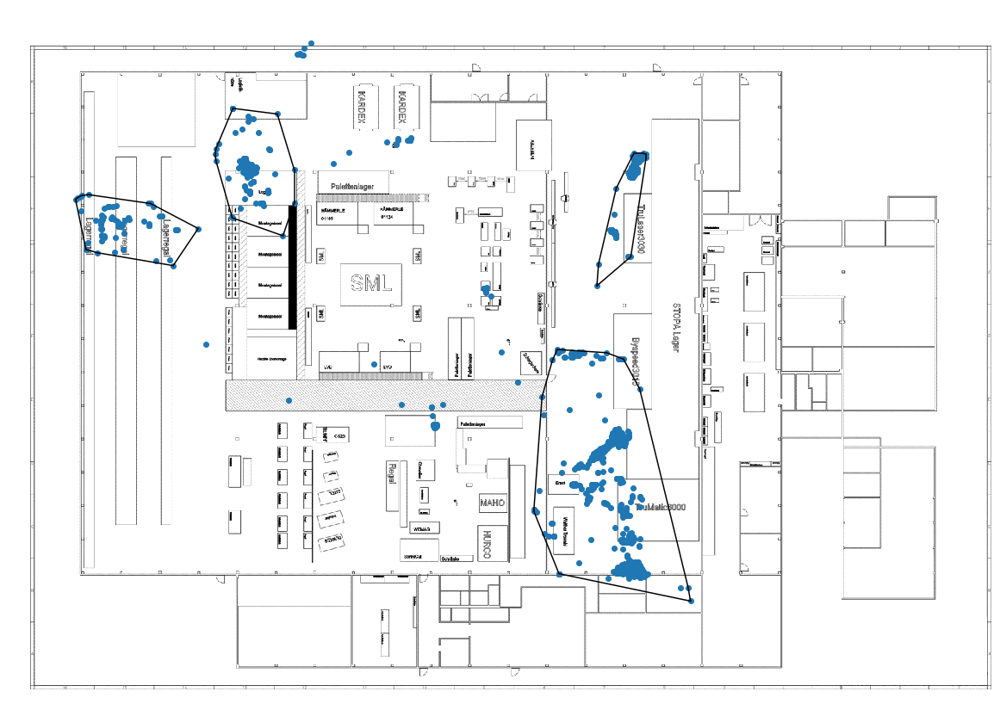

In [22]:
scatter_path(df, address=145401774635637016, min_area=20)

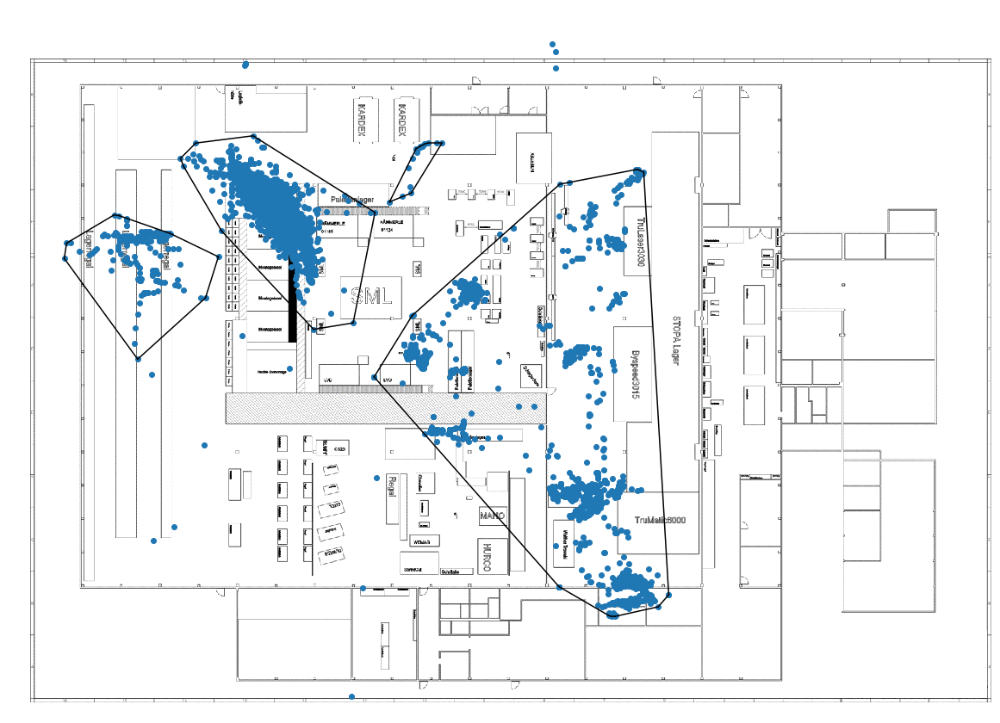

In [36]:
scatter_path(df, address=4751451578702838656, min_area=20)

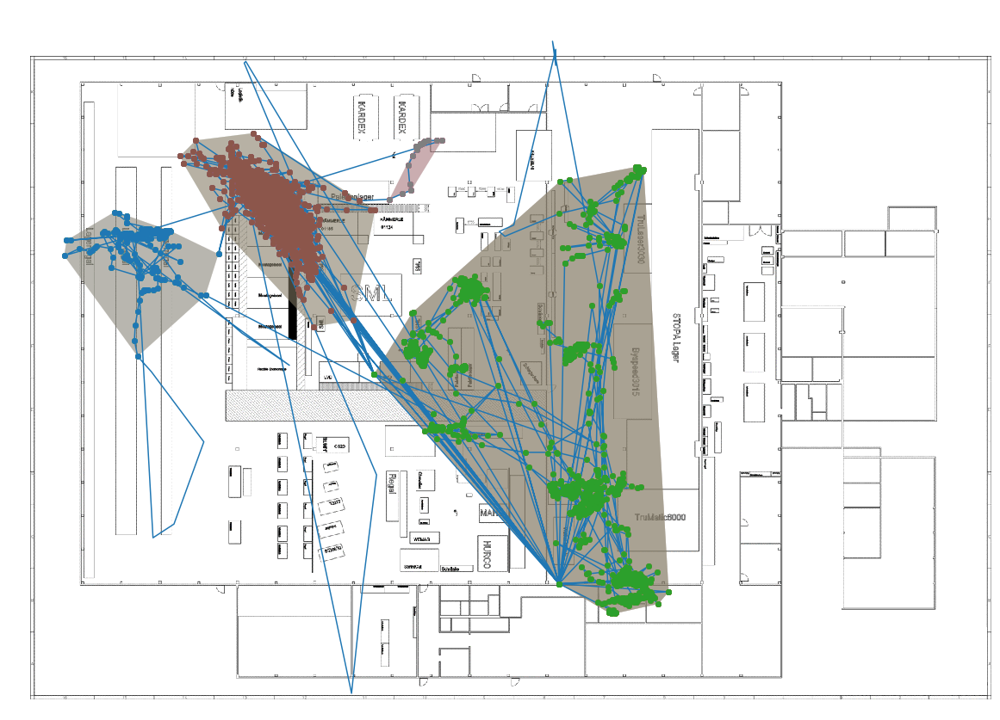

In [64]:
scatter_path(df, address=4751451578702838656, min_area=20, lines=True)

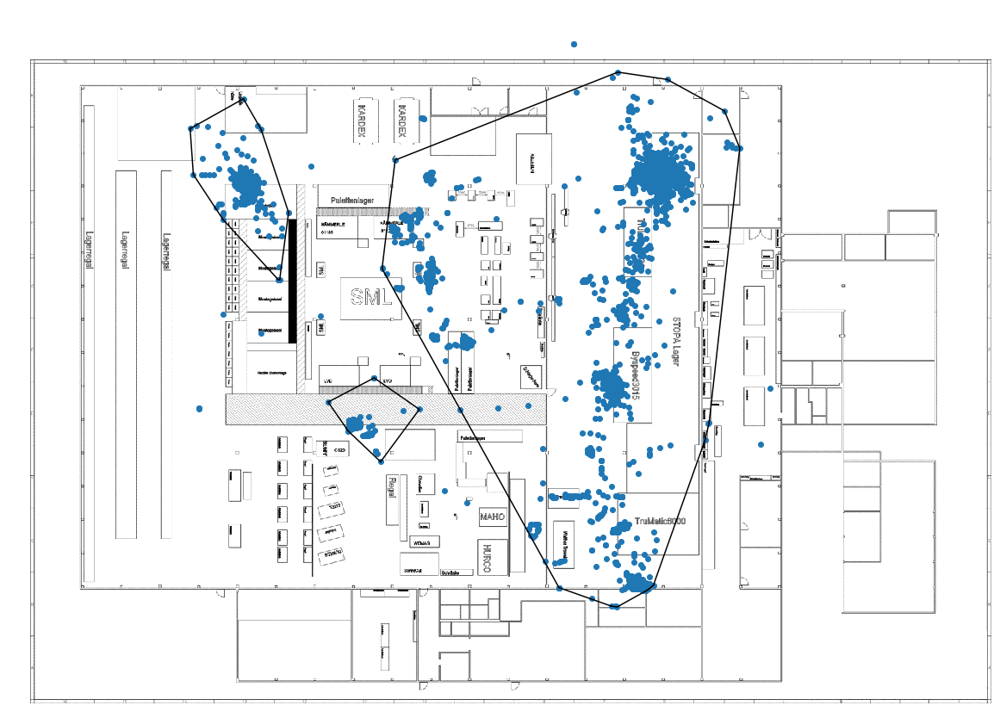

In [42]:
scatter_path(df, address=2292084713005523594, min_area=20)

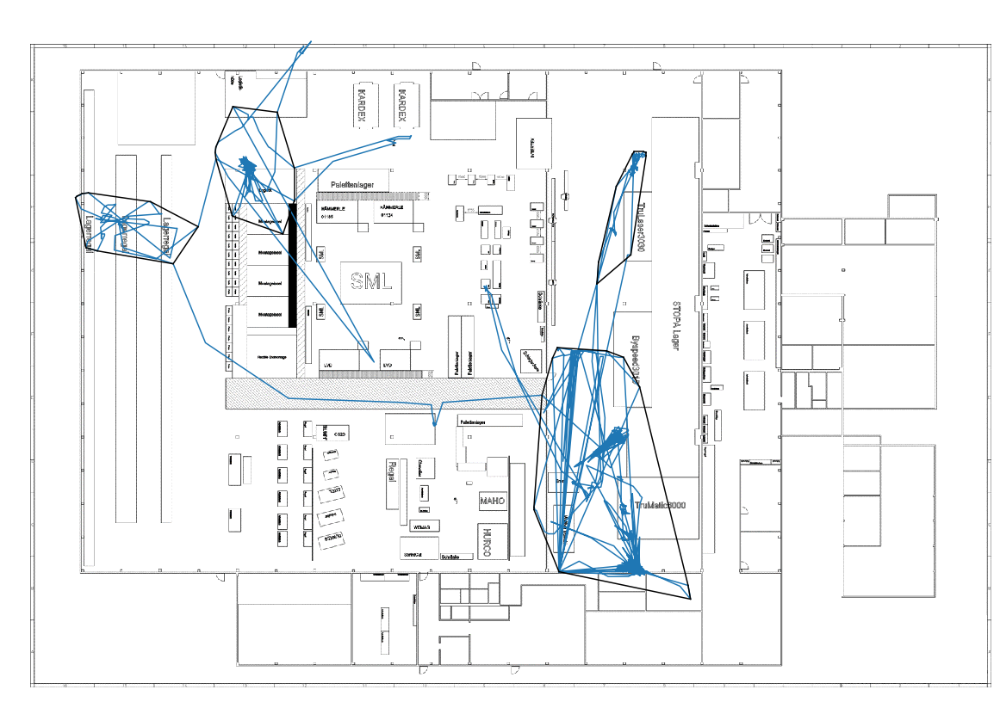

In [46]:
scatter_path(df, address=145401774635637016, min_area=20, lines=True)

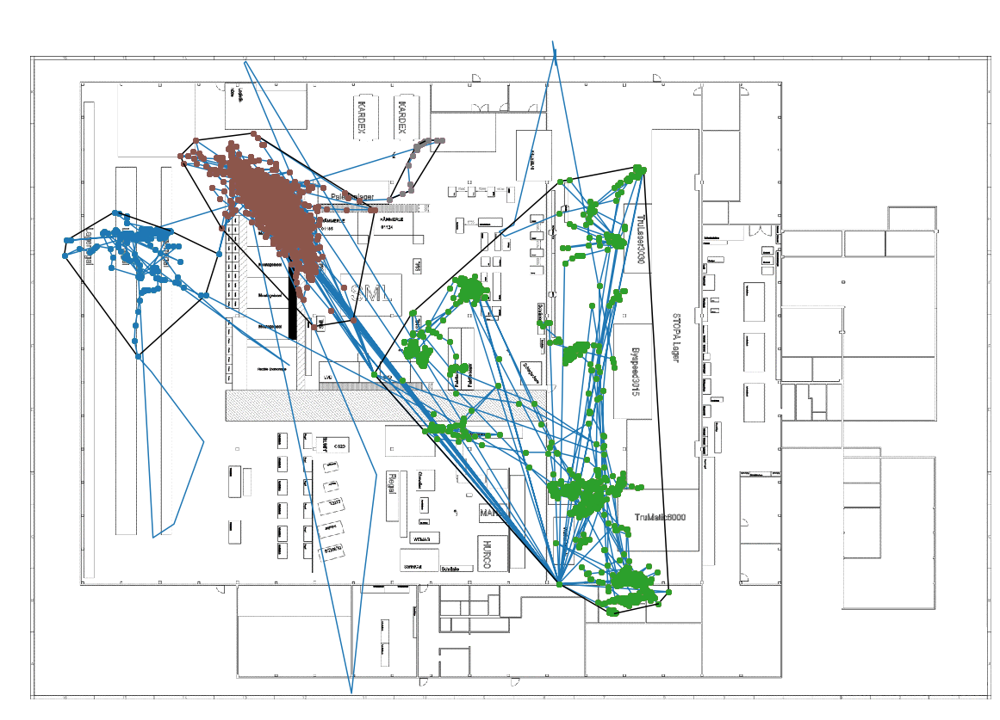

In [49]:
scatter_path(df, address=4751451578702838656, min_area=20, lines=True)

# Items

In [76]:
items.head()

,itemId,timestamp,address,parentItemId
0,NaN,1539593961630,-2571823634721508813,NaN
1,9247526,1539187090636,-1848788721524220278,-1
2,F7108688,1529477127141,-1,NaN
3,F7134239,1528538612844,-6373291646473613089,-1
4,F7154996,1529477143136,-1,NaN


In [170]:
items.address.value_counts()

-1                      30
-1743798228505193158     5
 5106149975160207938     5
 6629077505579689371     4
-1848788721524220278     4
 9096423301671818677     3
-8608182124092177080     3
-2571823634721508813     3
 897836185907794843      3
 5584577939061494859     3
-5655706921459459053     3
-378114927423601818      3
 1986543873053567483     3
 2070991107496355897     3
 3622430746677702478     3
-6196490120761152012     3
 4646720082062120060     3
 8375791865885302222     3
 4591818761713987449     3
 3407280054864427282     2
 8240429773739531826     2
-3170424921640195624     2
 8721004544596209723     2
-3939564973941109987     2
-1686734335080013094     2
 2600212495939589915     2
-6073876375101542463     2
-6975491984682628175     2
 5491168338925147774     2
-5838424063914740714     2
                        ..
 1405451950033454729     1
-2292084713005523594     1
-2956353988975089002     1
-7573228149069718550     1
 4923569006891484176     1
 1384569051694241367     1
-

In [77]:
items_history.head()

,id,itemId,timestamp,address,parentItemId
0,1,test,1519313607051,-1,-1
1,2,Kunde A,1520869772375,-1,test
2,3,F7487232,1528241748174,1986543873053567483,-1
3,4,F7512377,1528253447539,-4770966441840271855,-1
4,5,F7418156,1528272810868,2600212495939589915,-1


In [78]:
items.shape

(171, 4)

In [79]:
items_history.shape

(296, 5)

In [81]:
a = set(items.itemId.unique())

In [82]:
b = set(items_history.itemId.unique())

In [83]:
len(a), len(b)

(171, 171)

In [84]:
len(a-b)

0

In [85]:
len(b-a)

0

In [86]:
len(a.intersection(b))

171